<a href="https://colab.research.google.com/github/andrastuu/Thesisproject/blob/main/imageresizermaskcombiner.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import h5py
import numpy as np
from skimage.restoration import unsupervised_wiener
from skimage.filters import gaussian
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

# Open h5 file in read mode
with h5py.File('/content/drive/MyDrive/Galaxy10_DECals.h5', 'r') as f:
    images = f['images'][:]



  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-4-aa48aab89301>:21: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(img_gray, multichannel=True))


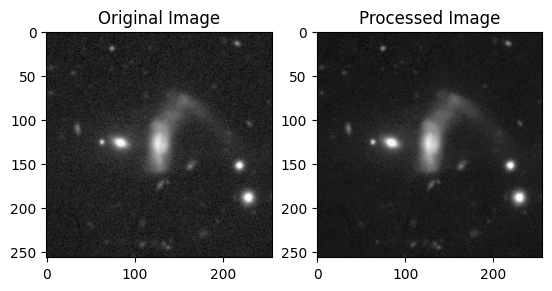

  0%|          | 1/17736 [00:00<4:01:12,  1.23it/s]

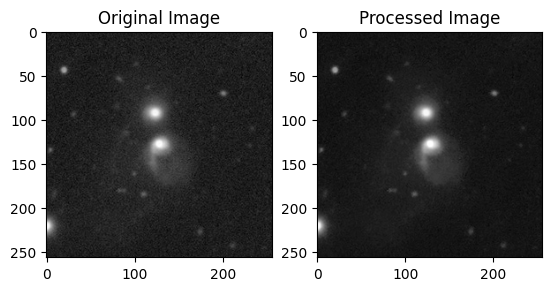

  0%|          | 2/17736 [00:01<4:46:04,  1.03it/s]

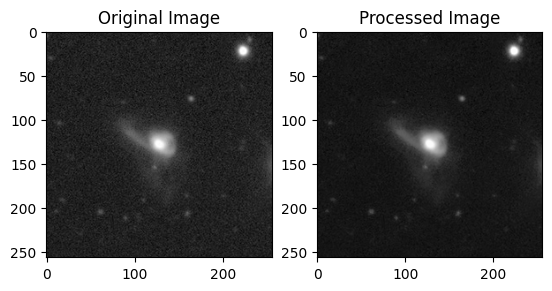

  0%|          | 3/17736 [00:02<4:20:04,  1.14it/s]

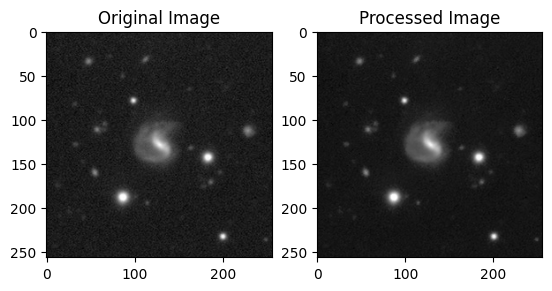

  0%|          | 4/17736 [00:03<4:06:20,  1.20it/s]

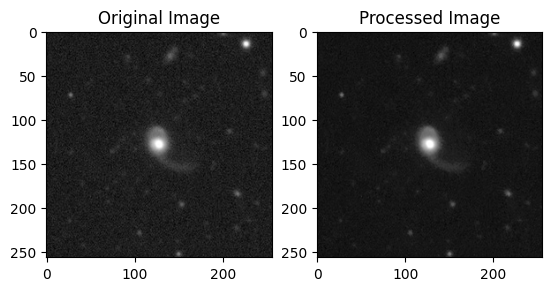

100%|██████████| 17736/17736 [2:05:14<00:00,  2.36it/s]


Processed images saved successfully.


In [ ]:
from tqdm import tqdm  # Import tqdm for the progress bar
# Create an empty array to store the processed images
processed_images = np.zeros((len(images), images.shape[1], images.shape[2]), dtype=np.float32)

# Parameters
patch_size = 3
search_window = 10

# Process all images and store in the processed_images array
for i, img in tqdm(enumerate(images), total=len(images)):  # Add a progress bar
    # Convert image to grayscale if it has multiple channels
    if len(img.shape) > 2:
        img_gray = rgb2gray(img)
    else:
        img_gray = img

    # Normalize the grayscale image to the range [0, 1]
    img_gray = img_gray.astype(np.float32) / 255.0

    # Estimate the noise standard deviation from the image.
    sigma_est = np.mean(estimate_sigma(img_gray, multichannel=True))

    # Apply non-local means filter
    h = 0.711 * sigma_est
    filtered_img = denoise_nl_means(img_gray, h=h, patch_size=patch_size, patch_distance=search_window, fast_mode=True)

    # Store processed image in the processed_images array
    processed_images[i] = filtered_img

    # Plot the first 5 images before and after processing
    if i < 5:
        fig, axes = plt.subplots(1, 2)
        axes[0].imshow(img_gray, cmap='gray')
        axes[0].set_title('Original Image')
        axes[1].imshow(filtered_img, cmap='gray')
        axes[1].set_title('Processed Image')
        plt.show()

# Save processed images as a single numpy array
output_path = '/content/drive/MyDrive/processed_images.npy'  # Specify the output file path
np.save(output_path, processed_images)
print("Processed images saved successfully.")

In [ ]:
import h5py
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, feature, restoration


# Open h5 file in read mode
with h5py.File('/content/drive/MyDrive/Galaxy10_DECals.h5', 'r') as f:
    img = f['images'][0]

preprocessed_images = {}

# Shape index analysis
shape_index = feature.shape_index(img)
preprocessed_images['shape_index'] = shape_index

# Image gradient
gradient = np.gradient(img)
preprocessed_images['gradient'] = gradient

# Automatic denoising
denoised_img = restoration.denoise_bilateral(img)
preprocessed_images['denoised'] = denoised_img

# Segmentation using OpenCV
# Convert image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Thresholding for segmentation
_, thresholded = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
# Find contours
contours, _ = cv2.findContours(thresholded, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# Create an empty image to store the masks
segmented_img = np.zeros_like(img)
# Draw contours on the empty image
cv2.drawContours(segmented_img, contours, -1, (255,255,255), thickness=cv2.FILLED)
preprocessed_images['segmented'] = segmented_img



# Now we'll display the preprocessed images
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
axs = axs.flatten()

for ax, (method, image) in zip(axs, preprocessed_images.items()):
    if method == 'gradient':
        # For gradient images, we'll display the x-gradient
        ax.imshow(image[0], cmap='gray')
    else:
        ax.imshow(image, cmap='gray')
    ax.set_title(f"{method} image")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  return func(*args, **kwargs)


ValueError: ignored

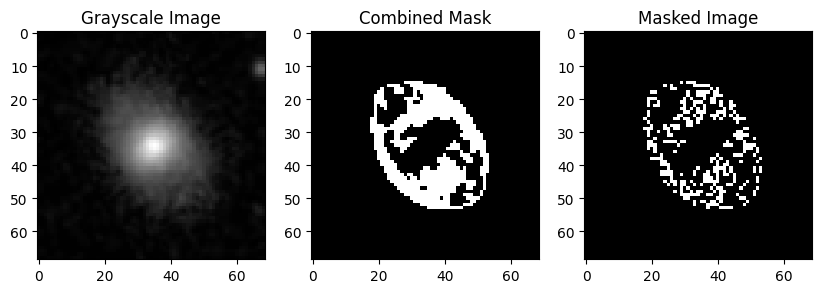

In [ ]:

# Take the first image
first_image = images[1]

# Assuming the first three channels are r, g, b
rgb_image = first_image[..., :3]
masks = first_image[..., 3:]

# Convert RGB image to grayscale
grayscale_image = cv2.cvtColor(rgb_image.astype('uint8'), cv2.COLOR_RGB2GRAY)

# Convert masks to binary
binary_masks = (masks > 0).astype('uint8')

# Bitwise AND operation on the binary masks
combined_mask = cv2.bitwise_and(binary_masks[..., 0], binary_masks[..., 1])
for i in range(2, binary_masks.shape[-1]):
    combined_mask = cv2.bitwise_and(combined_mask, binary_masks[..., i])

# Applying the mask to the grayscale image
masked_image = cv2.bitwise_and(grayscale_image, combined_mask)

# Plot the images
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(combined_mask, cmap='gray')
plt.title('Combined Mask')

plt.subplot(1, 3, 3)
plt.imshow(masked_image, cmap='gray')
plt.title('Masked Image')

plt.show()

In [ ]:

# Create an empty list to store the masked images
masked_images = []

for image in images:
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3]
    masks = image[..., 3:]

    # Convert RGB image to grayscale
    grayscale_image = cv2.cvtColor(rgb_image.astype('uint8'), cv2.COLOR_RGB2GRAY)

    # Convert masks to binary
    binary_masks = (masks > 0).astype('uint8')

    # Bitwise AND operation on the binary masks
    combined_mask = cv2.bitwise_and(binary_masks[..., 0], binary_masks[..., 1])
    for i in range(2, binary_masks.shape[-1]):
        combined_mask = cv2.bitwise_and(combined_mask, binary_masks[..., i])

    # Applying the mask to the grayscale image
    masked_image = cv2.bitwise_and(grayscale_image, combined_mask)

    # Append the masked image to the list
    masked_images.append(masked_image)

# Convert the list to a Numpy array
masked_images = np.array(masked_images)

# Save the masked_images array
save_path = '/content/drive/MyDrive/galaxy10sdss/masked_images.npy'
np.save(save_path, masked_images)
masked_images.ndim()

In [ ]:
import numpy as np

# Load the masked images
masked_images_path = '/content/drive/MyDrive/galaxy10sdss/masked_images.npy'
masked_images = np.load(masked_images_path)

# Print the dimensions of the array
print("Shape of the masked_images array:", masked_images.shape)


Shape of the masked_images array: (21785, 69, 69)


In [ ]:
import cv2
import numpy as np
from itertools import combinations

# Load the images
image_file_path = 'import cv2
import numpy as np
from itertools import combinations
import os

# Define the path where the images are stored
image_dir_path = '/content/drive/MyDrive/galaxy10decals'

# Iterate over the 17 files
for i in range(1, 18):
    image_file_path = os.path.join(image_dir_path, f'SDSS_processed_images_{i}.npy')
    images = np.load(image_file_path)

    # Create an empty dictionary to store the masked images for each combination
    masked_images_dict = {}

    # Generate all non-empty combinations of the four masks
    mask_indices = range(4)
    for r in range(1, 5):
        for comb in combinations(mask_indices, r):
            # Create an empty list to store the masked images for this combination
            masked_images = []

            for image in images:
                # Assuming the first three channels are r, g, b
                rgb_image = image[..., :3].astype('uint8')
                masks = image[..., 3:]

                # Convert masks to binary
                binary_masks = (masks > 0).astype('uint8')

                # Bitwise AND operation on the masks in the combination
                combined_mask = binary_masks[..., comb[0]]
                for j in comb[1:]:
                    combined_mask = cv2.bitwise_and(combined_mask, binary_masks[..., j])

                # Convert combined mask to 3-channel
                combined_mask_rgb = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2BGR)

                # Applying the mask to the RGB image
                masked_image = cv2.bitwise_and(rgb_image, combined_mask_rgb)

                # Append the masked image to the list
                masked_images.append(masked_image)

            # Convert the list to a Numpy array
            masked_images = np.array(masked_images)

            # Save the masked_images array
            save_path = f'/content/drive/MyDrive/galaxy10sdss/masked_images_comb_{comb}_file_{i}.npy'
            np.save(save_path, masked_images)

            # Store the array in the dictionary
            masked_images_dict[comb] = masked_images
'
images = np.load(image_file_path)

# Create an empty dictionary to store the masked images for each combination
masked_images_dict = {}

# Generate all non-empty combinations of the four masks
mask_indices = range(4)
for r in range(1, 5):
    for comb in combinations(mask_indices, r):
        # Create an empty list to store the masked images for this combination
        masked_images = []

        for image in images:
            # Assuming the first three channels are r, g, b
            rgb_image = image[..., :3].astype('uint8')
            masks = image[..., 3:]

            # Convert masks to binary
            binary_masks = (masks > 0).astype('uint8')

            # Bitwise AND operation on the masks in the combination
            combined_mask = binary_masks[..., comb[0]]
            for i in comb[1:]:
                combined_mask = cv2.bitwise_and(combined_mask, binary_masks[..., i])

            # Convert combined mask to 3-channel
            combined_mask_rgb = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2BGR)

            # Applying the mask to the RGB image
            masked_image = cv2.bitwise_and(rgb_image, combined_mask_rgb)

            # Append the masked image to the list
            masked_images.append(masked_image)

        # Convert the list to a Numpy array
        masked_images = np.array(masked_images)

        # Save the masked_images array
        save_path = f'/content/drive/MyDrive/galaxy10sdss/masked_images_comb_{comb}.npy'
        np.save(save_path, masked_images)

        # Store the array in the dictionary
        masked_images_dict[comb] = masked_images

# Now, masked_images_dict is a dictionary where the keys are tuples representing the combinations of masks,
# and the values are numpy arrays containing the masked RGB images for each combination.


In [ ]:
import cv2
import numpy as np
from itertools import combinations
import os

# Define the path where the images are stored
image_dir_path = '/content/drive/MyDrive/galaxy10decals/'

# Iterate over the 17 files
for i in range(1, 18):
    image_file_path = os.path.join(image_dir_path, f'SDSS_processed_images_{i}.npy')
    images = np.load(image_file_path)

    # Create an empty dictionary to store the masked images for each combination
    masked_images_dict = {}

    # Generate all non-empty combinations of the four masks
    mask_indices = range(4)
    for r in range(1, 5):
        for comb in combinations(mask_indices, r):
            # Create an empty list to store the masked images for this combination
            masked_images = []

            for image in images:
                # Assuming the first three channels are r, g, b
                rgb_image = image[..., :3].astype('uint8')
                masks = image[..., 3:]

                # Convert masks to binary
                binary_masks = (masks > 0).astype('uint8')

                # Bitwise AND operation on the masks in the combination
                combined_mask = binary_masks[..., comb[0]]
                for j in comb[1:]:
                    combined_mask = cv2.bitwise_and(combined_mask, binary_masks[..., j])

                # Convert combined mask to 3-channel
                combined_mask_rgb = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2BGR)

                # Applying the mask to the RGB image
                masked_image = cv2.bitwise_and(rgb_image, combined_mask_rgb)

                # Append the masked image to the list
                masked_images.append(masked_image)

            # Convert the list to a Numpy array
            masked_images = np.array(masked_images)

            # Save the masked_images array
            save_path = f'/content/drive/MyDrive/galaxy10decals/masked_images_comb_{comb}_file_{i}.npy'
            np.save(save_path, masked_images)

            # Store the array in the dictionary
            masked_images_dict[comb] = masked_images


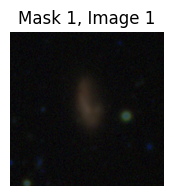

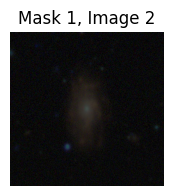

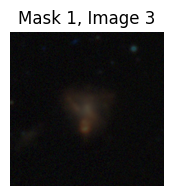

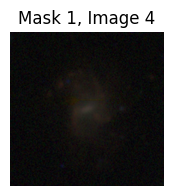

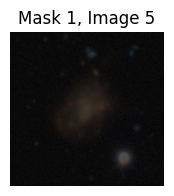

...

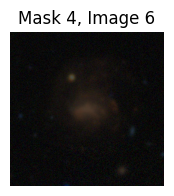

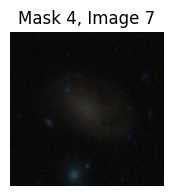

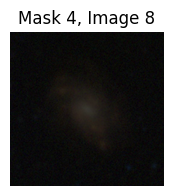

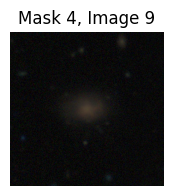

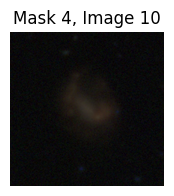

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assume images is your numpy array of images
image_file_path = '/content/drive/MyDrive/galaxy10decals/SDSS_processed_images_1.npy'
images = np.load(image_file_path)

# Define blending factor. A higher value will retain more of the original image.
blend_factor = 0.3

# Iterate over the four masks
for mask_index in range(4):
    # Create an empty list to store the masked images for this mask
    masked_images = []

    for image in images:
        # Assuming the first three channels are r, g, b
        rgb_image = image[..., :3].astype('uint8')
        mask = image[..., mask_index+3]

        # Convert mask to binary
        binary_mask = (mask > 0).astype('uint8')

        # Convert binary mask to 3-channel
        binary_mask_rgb = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)

        # Applying the mask to the RGB image
        masked_image = cv2.bitwise_and(rgb_image, binary_mask_rgb)

        # Blend the masked image with the original image
        blended_image = cv2.addWeighted(rgb_image, blend_factor, masked_image, 1 - blend_factor, 0)

        # Append the blended image to the list
        masked_images.append(blended_image)

    # Convert the list to a Numpy array
    masked_images = np.array(masked_images)

    # Plot the first 10 images for this mask
    for i in range(10):
        plt.figure(figsize=(2,2))
        plt.imshow(cv2.cvtColor(masked_images[i], cv2.COLOR_BGR2RGB))
        plt.title(f'Mask {mask_index+1}, Image {i+1}')
        plt.axis('off')
        plt.show()




In [ ]:
import cv2
import numpy as np
import os

# Define the path where the images are stored
image_dir_path = '/content/drive/MyDrive/galaxy10decals'

# Define blending factor. A higher value will retain more of the original image.
blend_factor = 0.3

# Initialize an empty list for each mask
masked_images_1 = []
masked_images_2 = []
masked_images_3 = []
masked_images_4 = []

# Iterate over the 17 files
for i in range(1, 18):
    image_file_path = os.path.join(image_dir_path, f'SDSS_processed_images_{i}.npy')
    images = np.load(image_file_path)

    # Iterate over the four masks
    for mask_index in range(4):
        for image in images:
            # Assuming the first three channels are r, g, b
            rgb_image = image[..., :3].astype('uint8')
            mask = image[..., mask_index+3]

            # Convert mask to binary
            binary_mask = (mask > 0).astype('uint8')

            # Convert binary mask to 3-channel
            binary_mask_rgb = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)

            # Applying the mask to the RGB image
            masked_image = cv2.bitwise_and(rgb_image, binary_mask_rgb)

            # Blend the masked image with the original image
            blended_image = cv2.addWeighted(rgb_image, blend_factor, masked_image, 1 - blend_factor, 0)

            # Append the blended image to the corresponding list
            if mask_index == 0:
                masked_images_1.append(blended_image)
            elif mask_index == 1:
                masked_images_2.append(blended_image)
            elif mask_index == 2:
                masked_images_3.append(blended_image)
            elif mask_index == 3:
                masked_images_4.append(blended_image)

# Convert the lists to Numpy arrays
masked_images_1 = np.array(masked_images_1)
masked_images_2 = np.array(masked_images_2)
masked_images_3 = np.array(masked_images_3)
masked_images_4 = np.array(masked_images_4)

# Save the masked_images arrays
np.save(os.path.join(image_dir_path, 'masked_images_mask_1.npy'), masked_images_1)
np.save(os.path.join(image_dir_path, 'masked_images_mask_2.npy'), masked_images_2)
np.save(os.path.join(image_dir_path, 'masked_images_mask_3.npy'), masked_images_3)
np.save(os.path.join(image_dir_path, 'masked_images_mask_4.npy'), masked_images_4)


In [ ]:
import cv2
import numpy as np
import os

# Define the path where the images are stored
image_dir_path = '/content/drive/MyDrive/galaxy10decals'

# Define blending factor. A higher value will retain more of the original image.
blend_factor = 0.3

# Initialize an empty list for each mask
masked_images_1 = []
masked_images_2 = []
masked_images_3 = []
masked_images_4 = []

# Iterate over the 17 files
for i in range(1, 18):
    image_file_path = os.path.join(image_dir_path, f'SDSS_processed_images_{i}.npy')
    images = np.load(image_file_path)

    print(f'Loaded {images.shape[0]} images from file {i}')

    # Iterate over the four masks
    for mask_index in range(4):
        for image in images:
            # Assuming the first three channels are r, g, b
            rgb_image = image[..., :3].astype('uint8')
            mask = image[..., mask_index+3]

            # Convert mask to binary
            binary_mask = (mask > 0).astype('uint8')

            # Convert binary mask to 3-channel
            binary_mask_rgb = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)

            # Applying the mask to the RGB image
            masked_image = cv2.bitwise_and(rgb_image, binary_mask_rgb)

            # Blend the masked image with the original image
            blended_image = cv2.addWeighted(rgb_image, blend_factor, masked_image, 1 - blend_factor, 0)

            # Append the blended image to the corresponding list
            if mask_index == 0:
                masked_images_1.append(blended_image)
            elif mask_index == 1:
                masked_images_2.append(blended_image)
            elif mask_index == 2:
                masked_images_3.append(blended_image)
            elif mask_index == 3:
                masked_images_4.append(blended_image)

# Convert the lists to Numpy arrays
masked_images_1 = np.array(masked_images_1)
masked_images_2 = np.array(masked_images_2)
masked_images_3 = np.array(masked_images_3)
masked_images_4 = np.array(masked_images_4)

print(f'Saved {masked_images_1.shape[0]} images for mask 1')
print(f'Saved {masked_images_2.shape[0]} images for mask 2')
print(f'Saved {masked_images_3.shape[0]} images for mask 3')
print(f'Saved {masked_images_4.shape[0]} images for mask 4')

Loaded 1000 images from file 1
Loaded 1000 images from file 2
Loaded 1000 images from file 3
Loaded 1000 images from file 4
Loaded 1000 images from file 5
Loaded 1000 images from file 6
Loaded 1000 images from file 7
Loaded 1000 images from file 8
Loaded 1000 images from file 9
Loaded 1000 images from file 10
Loaded 1000 images from file 11
Loaded 1000 images from file 12
Loaded 1000 images from file 13
Loaded 1000 images from file 14
Loaded 1000 images from file 15
Loaded 1000 images from file 16
Loaded 736 images from file 17


KeyboardInterrupt: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import h5py
import numpy as np
from tensorflow.keras import utils
import cv2
from scipy import ndimage
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects
from skimage.restoration import denoise_nl_means
from skimage.filters import sobel
import matplotlib.pyplot as plt
from tqdm import tqdm  # import tqdm for progress bar

# To get the images and labels from file
with h5py.File('/content/drive/MyDrive/Galaxy10_DECals.h5', 'r') as F:
    images = np.array(F['images'])
    labels = np.array(F['ans'])

# To convert the labels to categorical 10 classes
labels = utils.to_categorical(labels, 10)

# To convert to desirable type
labels = labels.astype(np.float32)
images = images.astype(np.float32)

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese

# Initialize an empty list for each mask
masked_images_shape_idx = []
masked_images_gradient = []
masked_images_denoised = []
masked_images_cv_seg = []

for image in tqdm(images):
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3].astype('uint8')

    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Generate shape index mask
    shape_idx_img = frangi(gray_img)
    cv2.normalize(shape_idx_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    masked_image_shape_idx = cv2.bitwise_and(rgb_image, shape_idx_mask_rgb)
    masked_images_shape_idx.append(masked_image_shape_idx)

    # Generate gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    cv2.normalize(gradient_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    masked_image_gradient = cv2.bitwise_and(rgb_image, gradient_mask_rgb)
    masked_images_gradient.append(masked_image_gradient)

    # Generate denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    cv2.normalize(denoised_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    denoised_mask = (denoised_img > 0).astype('uint8')
    denoised_mask_rgb = cv2.cvtColor(denoised_mask, cv2.COLOR_GRAY2BGR)
    masked_image_denoised = cv2.bitwise_and(rgb_image, denoised_mask_rgb)
    masked_images_denoised.append(masked_image_denoised)

    # Generate Chan-Vese segmentation mask
    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg = cv_seg.astype(np.uint8)
    cv2.normalize(cv_seg, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv_seg_mask = (cv_seg > 0).astype('uint8')
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg_mask, cv2.COLOR_GRAY2BGR)
    masked_image_cv_seg = cv2.bitwise_and(rgb_image, cv_seg_mask_rgb)
    masked_images_cv_seg.append(masked_image_cv_seg)

# Convert the lists to Numpy arrays
masked_images_shape_idx = np.array(masked_images_shape_idx)
masked_images_gradient = np.array(masked_images_gradient)
masked_images_denoised = np.array(masked_images_denoised)
masked_images_cv_seg = np.array(masked_images_cv_seg)

print(f'Saved {masked_images_shape_idx.shape[0]} images for shape index mask')
print(f'Saved {masked_images_gradient.shape[0]} images for gradient mask')
print(f'Saved {masked_images_denoised.shape[0]} images for denoised mask')
print(f'Saved {masked_images_cv_seg.shape[0]} images for CV Segmentation mask')

# Save the masked_images arrays
np.save('/content/drive/MyDrive/galaxy10decals/masked_images_shape_idx.npy', masked_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/masked_images_gradient.npy', masked_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/masked_images_denoised.npy', masked_images_denoised)
np.save('/content/drive/MyDrive/galaxy10decals/masked_images_cv_seg.npy', masked_images_cv_seg)



  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-3-ecbb75883c3a>:45: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
100%|██████████| 17736/17736 [2:00:51<00:00,  2.45it/s]


Saved 17736 images for shape index mask
Saved 17736 images for gradient mask
Saved 17736 images for denoised mask
Saved 17736 images for CV Segmentation mask


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images
image_file_path = '/content/drive/MyDrive/galaxy10sdss/Galaxy10SDSSprocessedmasks.npy'
images = np.load(image_file_path)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Load the images
image_file_path = '/content/drive/MyDrive/galaxy10sdss/Galaxy10SDSSprocessedmasks.npy'
images = np.load(image_file_path)

# Define blending factor. A higher value will retain more of the original image.
blend_factor = 0.3

# Iterate over the four masks
for mask_index in range(4):
    # Create an empty list to store the masked images for this mask
    masked_images = []

    for image in images:
        # Assuming the first three channels are r, g, b
        rgb_image = image[..., :3].astype('uint8')
        mask = image[..., mask_index+3]

        # Convert mask to binary
        binary_mask = (mask > 0).astype('uint8')

        # Convert binary mask to 3-channel
        binary_mask_rgb = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)

        # Applying the mask to the RGB image
        masked_image = cv2.bitwise_and(rgb_image, binary_mask_rgb)

        # Blend the masked image with the original image
        blended_image = cv2.addWeighted(rgb_image, blend_factor, masked_image, 1 - blend_factor, 0)

        # Append the blended image to the list
        masked_images.append(blended_image)

    # Convert the list to a Numpy array
    masked_images = np.array(masked_images)

    # Save masked_images as a numpy array
    output_file_path = os.path.splitext(image_file_path)[0] + f'_masked_{mask_index+1}.npy'
    np.save(output_file_path, masked_images)

    # Plot the first 10 images for this mask
    for i in range(10):
        plt.figure(figsize=(2,2))
        plt.imshow(cv2.cvtColor(masked_images[i], cv2.COLOR_BGR2RGB))
        plt.title(f'Mask {mask_index+1}, Image {i+1}')
        plt.axis('off')
        plt.show()


KeyboardInterrupt: ignored

In [ ]:
import h5py
import numpy as np
from tensorflow.keras import utils
import cv2
from scipy import ndimage
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects
from skimage.restoration import denoise_nl_means
from skimage.filters import sobel
import matplotlib.pyplot as plt
from tqdm import tqdm  # import tqdm for progress bar

# To get the images and labels from file
with h5py.File('/content/drive/MyDrive/Galaxy10_DECals.h5', 'r') as F:
    images = np.array(F['images'])
    labels = np.array(F['ans'])

# To convert the labels to categorical 10 classes
labels = utils.to_categorical(labels, 10)

# To convert to desirable type
labels = labels.astype(np.float32)
images = images.astype(np.float32)

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize an empty list for each mask
blended_images_shape_idx = []
blended_images_gradient = []
denoised_images = []
blended_images_cv_seg = []

for image in tqdm(images):
    # ...
    rgb_image = image[..., :3].astype('uint8')

    # For shape index mask

    # ...

    # Repeat similar assertions for the other masks.


    gray_img = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

    # For shape index mask
    shape_idx_img = frangi(gray_img)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    assert shape_idx_mask.shape[:2] == rgb_image.shape[:2]
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    blended_image_shape_idx = cv2.bitwise_and(rgb_image, shape_idx_mask_rgb)

    # For gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    blended_image_gradient = cv2.bitwise_and(normalized_image, normalized_image, mask=gradient_mask_rgb)
    blended_images_gradient.append(blended_image_gradient)

    # For denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    denoised_images.append(denoised_img)

    # For Chan-Vese segmentation mask
    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg_mask = (cv_seg > 0).astype('uint8')
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg_mask, cv2.COLOR_GRAY2BGR)
    blended_image_cv_seg = cv2.bitwise_and(normalized_image, normalized_image, mask=cv_seg_mask_rgb)
    blended_images_cv_seg.append(blended_image_cv_seg)

            # After the masks have been applied and the images blended
    # ...
    mask_visual = (cv_seg_mask_rgb).astype(np.uint8)
    plt.imshow(mask_visual, cmap='gray')
    plt.show()

    # Display the first image from each category
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.imshow(blended_images_shape_idx[0])
    plt.title('Shape Index Mask')

    plt.subplot(1, 4, 2)
    plt.imshow(blended_images_gradient[0])
    plt.title('Gradient Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(denoised_images[0])
    plt.title('Denoised Mask')

    plt.subplot(1, 4, 4)
    plt.imshow(blended_images_cv_seg[0])
    plt.title('CV Segmentation Mask')
# After the loop, convert the lists to Numpy arrays
blended_images_shape_idx = np.array(blended_images_shape_idx)
blended_images_gradient = np.array(blended_images_gradient)
denoised_images = np.array(denoised_images)
blended_images_cv_seg = np.array(blended_images_cv_seg)

# Save the arrays
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_shape_idx.npy', blended_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_gradient.npy', blended_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/denoised_images.npy', denoised_images)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_cv_seg.npy', blended_images_cv_seg)


  0%|          | 0/17736 [00:00<?, ?it/s]


error: ignored

  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-19-0a73437611f2>:40: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")


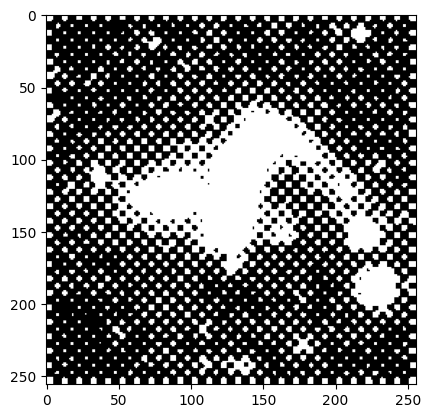

  0%|          | 1/17736 [00:00<3:00:58,  1.63it/s]

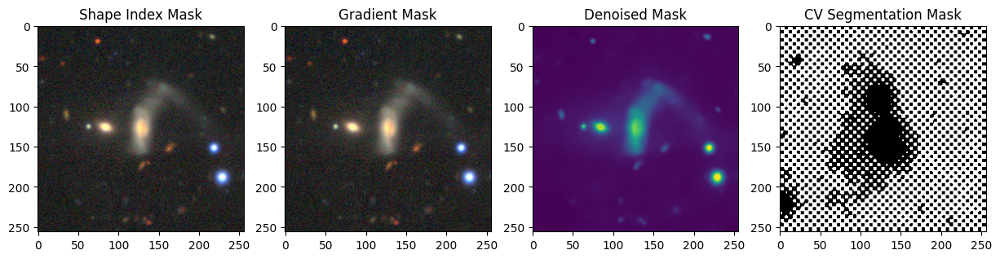

  0%|          | 2/17736 [00:02<5:23:21,  1.09s/it]

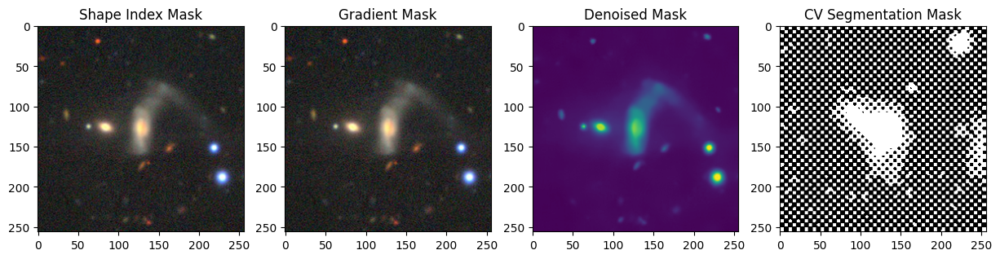

  0%|          | 3/17736 [00:03<5:21:57,  1.09s/it]

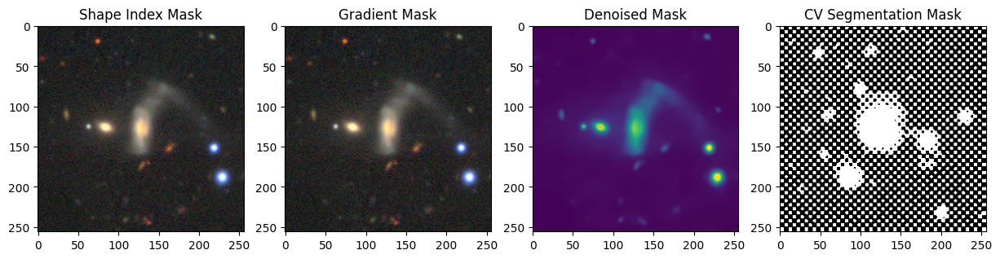

  0%|          | 4/17736 [00:04<5:21:19,  1.09s/it]

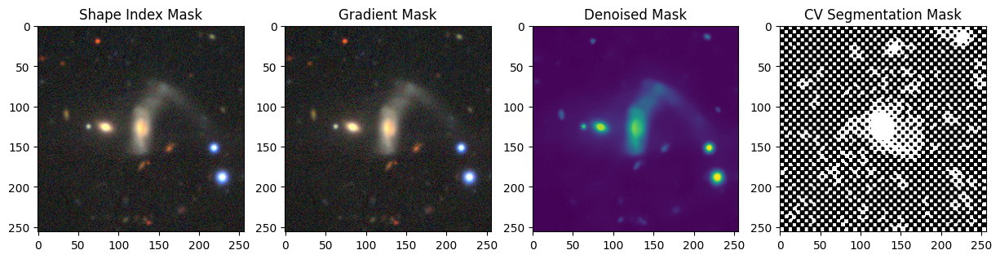

  0%|          | 5/17736 [00:06<6:19:58,  1.29s/it]


KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize an empty list for each mask
blended_images_shape_idx = []
blended_images_gradient = []
denoised_images = []
blended_images_cv_seg = []

for image in tqdm(images):
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3].astype('uint8')
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # For shape index mask
    shape_idx_img = frangi(gray_img)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    blended_image_shape_idx = cv2.bitwise_or(rgb_image, shape_idx_mask_rgb)
    blended_images_shape_idx.append(blended_image_shape_idx)

    # For gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    blended_image_gradient = cv2.bitwise_or(rgb_image, gradient_mask_rgb)
    blended_images_gradient.append(blended_image_gradient)

    # For denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    denoised_images.append(denoised_img)

    # For Chan-Vese segmentation mask
    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg = cv_seg.astype(np.uint8)
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg, cv2.COLOR_GRAY2BGR)
    blended_image_cv_seg = cv2.bitwise_or(rgb_image, cv_seg_mask_rgb)
    blended_images_cv_seg.append(blended_image_cv_seg)

        # After the masks have been applied and the images blended
    # ...
    mask_visual = (cv_seg_mask_rgb*255).astype(np.uint8)
    plt.imshow(mask_visual, cmap='gray')
    plt.show()

    # Display the first image from each category
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.imshow(blended_images_shape_idx[0])
    plt.title('Shape Index Mask')

    plt.subplot(1, 4, 2)
    plt.imshow(blended_images_gradient[0])
    plt.title('Gradient Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(denoised_images[0])
    plt.title('Denoised Mask')

    plt.subplot(1, 4, 4)
    plt.imshow(blended_images_cv_seg[0]*255)
    plt.title('CV Segmentation Mask')
# Convert the lists to Numpy arrays
blended_images_shape_idx = np.array(blended_images_shape_idx)
blended_images_gradient = np.array(blended_images_gradient)
denoised_images = np.array(denoised_images)
blended_images_cv_seg = np.array(blended_images_cv_seg)

print(f'Saved {blended_images_shape_idx.shape[0]} images for shape index mask')
print(f'Saved {blended_images_gradient.shape[0]} images for gradient mask')
print(f'Saved {denoised_images.shape[0]} denoised images')
print(f'Saved {blended_images_cv_seg.shape[0]} images for CV Segmentation mask')

# Save the arrays
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_shape_idx.npy', blended_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_gradient.npy', blended_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/denoised_images.npy', denoised_images)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_cv_seg.npy', blended_images_cv_seg)


  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-27-8e04eae7cba9>:40: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")


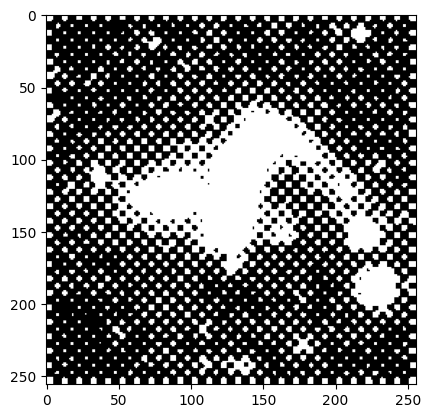

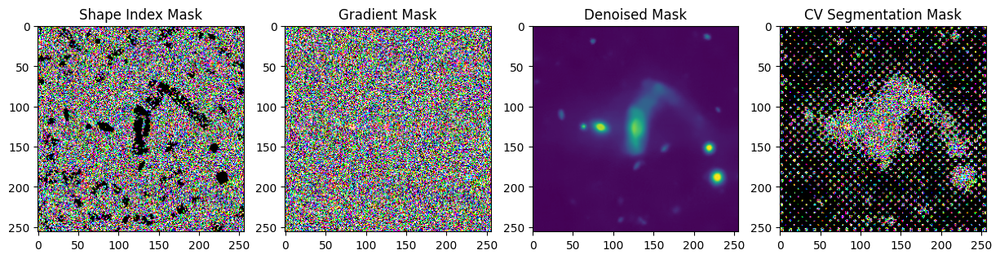

  0%|          | 1/17736 [00:01<6:11:25,  1.26s/it]

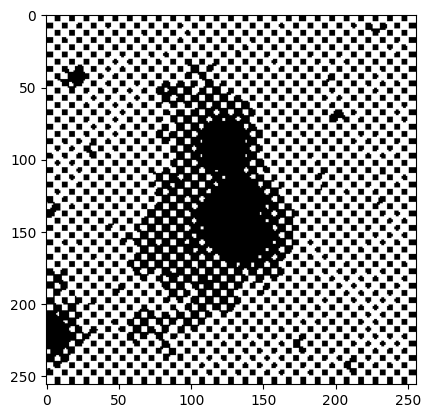

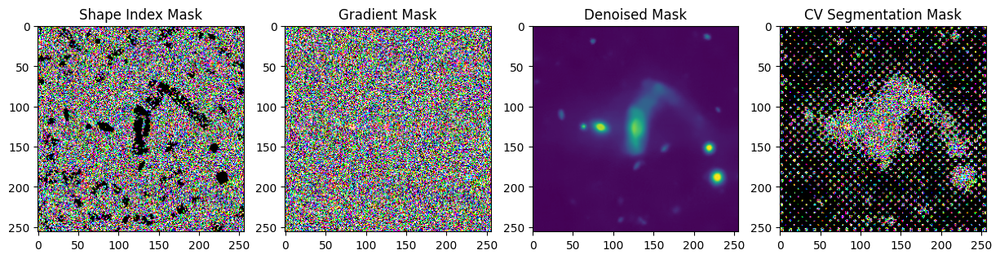

  0%|          | 2/17736 [00:02<6:09:03,  1.25s/it]

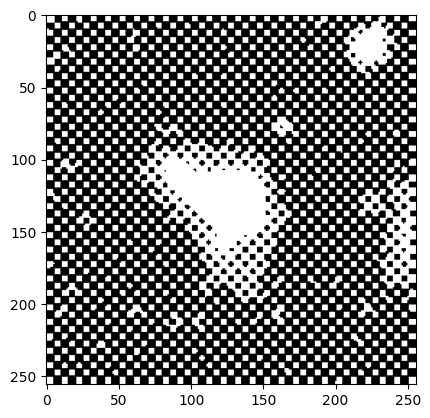

  0%|          | 2/17736 [00:03<9:00:07,  1.83s/it]


KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize an empty list for each mask
segmented_images_shape_idx = []
segmented_images_gradient = []
denoised_images = []
segmented_images_cv_seg = []

for image in tqdm(images):
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3].astype('uint8')
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # For shape index mask
    shape_idx_img = frangi(gray_img)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    segmented_image_shape_idx = cv2.bitwise_and(rgb_image, shape_idx_mask_rgb)
    segmented_images_shape_idx.append(segmented_image_shape_idx)

    # For gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    segmented_image_gradient = cv2.bitwise_and(rgb_image, gradient_mask_rgb)
    segmented_images_gradient.append(segmented_image_gradient)

    # For denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    denoised_images.append(denoised_img)

    # For Chan-Vese segmentation mask
    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg = cv_seg.astype(np.uint8)
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg, cv2.COLOR_GRAY2BGR)
    segmented_image_cv_seg = cv2.bitwise_and(rgb_image, cv_seg_mask_rgb)
    segmented_images_cv_seg.append(segmented_image_cv_seg)

    # Display the first image from each category
        # After the masks have been applied and the images blended
    # ...
    mask_visual = (cv_seg_mask_rgb*255).astype(np.uint8)
    plt.imshow(mask_visual, cmap='gray')
    plt.show()

    # Display the first image from each category
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.imshow(segmented_images_shape_idx[0]*255)
    plt.title('Shape Index Mask')

    plt.subplot(1, 4, 2)
    plt.imshow(segmented_images_gradient[0]*255)
    plt.title('Gradient Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(denoised_images[0])
    plt.title('Denoised Mask')

    plt.subplot(1, 4, 4)
    plt.imshow(segmented_images_cv_seg[0]*255)
    plt.title('CV Segmentation Mask')

    plt.show()
# Convert the lists to Numpy arrays
segmented_images_shape_idx = np.array(segmented_images_shape_idx)
segmented_images_gradient = np.array(segmented_images_gradient)
denoised_images = np.array(denoised_images)
segmented_images_cv_seg = np.array(segmented_images_cv_seg)

print(f'Saved {segmented_images_shape_idx.shape[0]} images for shape index mask')
print(f'Saved {segmented_images_gradient.shape[0]} images for gradient mask')
print(f'Saved {denoised_images.shape[0]} denoised images')
print(f'Saved {segmented_images_cv_seg.shape[0]} images for CV Segmentation mask')

# Save the arrays
np.save('/content/drive/MyDrive/galaxy10decals/segmented_images_shape_idx.npy', segmented_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/segmented_images_gradient.npy', segmented_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/denoised_images.npy', denoised_images)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_cv_seg.npy', segmented_images_cv_seg)


  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-17-bbd8d9549721>:43: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")


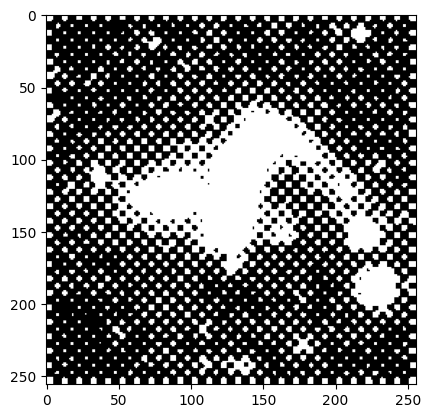

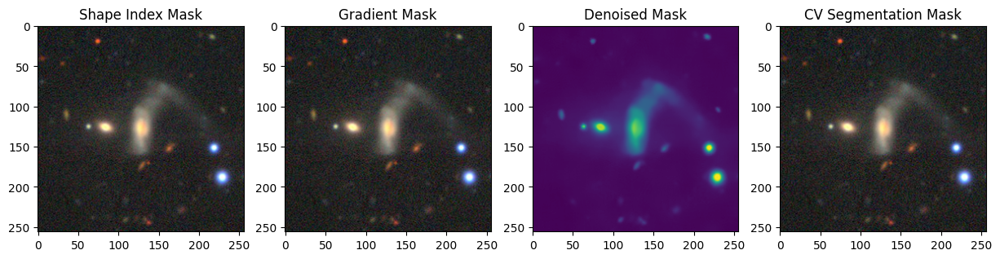

  0%|          | 1/17736 [00:01<6:18:55,  1.28s/it]

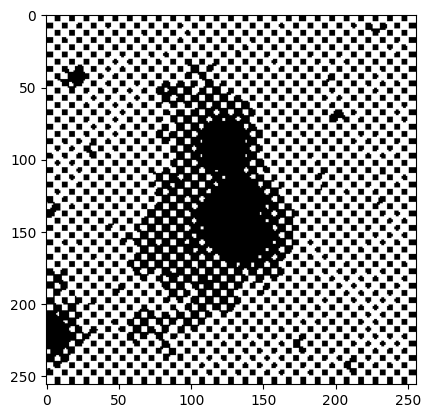

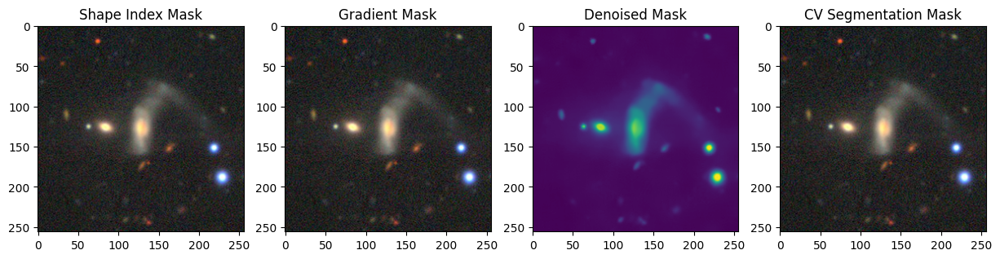

  0%|          | 2/17736 [00:02<7:26:12,  1.51s/it]

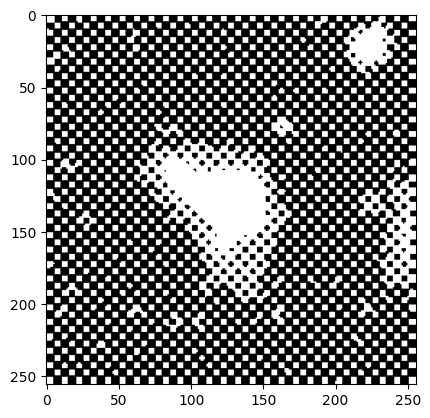

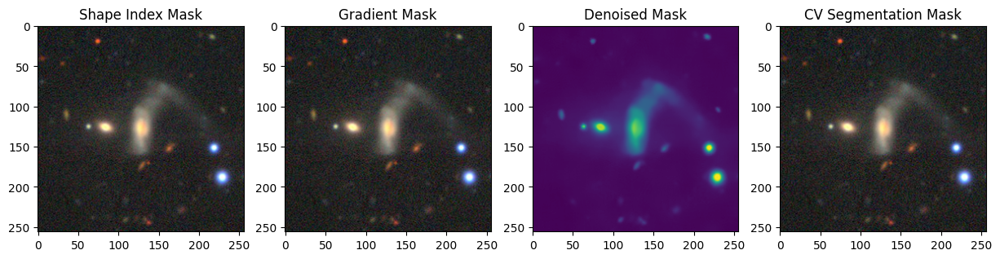

  0%|          | 3/17736 [00:04<6:51:31,  1.39s/it]

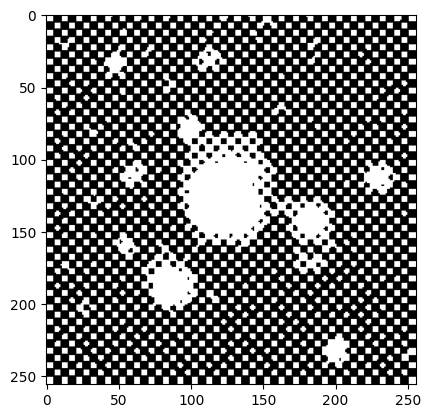

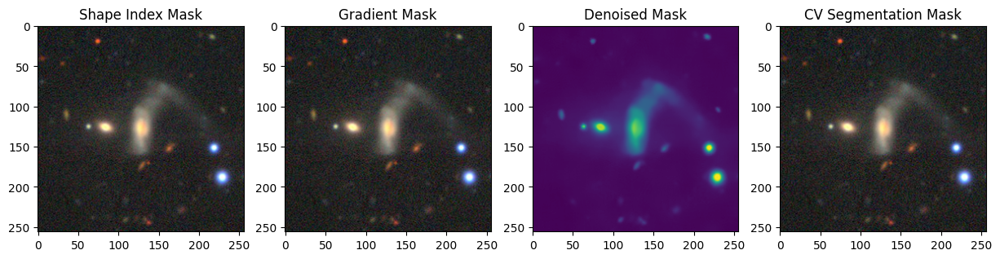

  0%|          | 4/17736 [00:05<6:36:12,  1.34s/it]

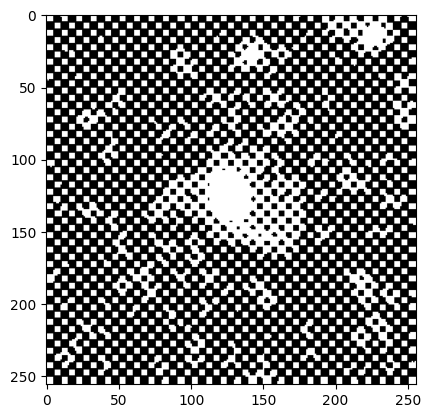

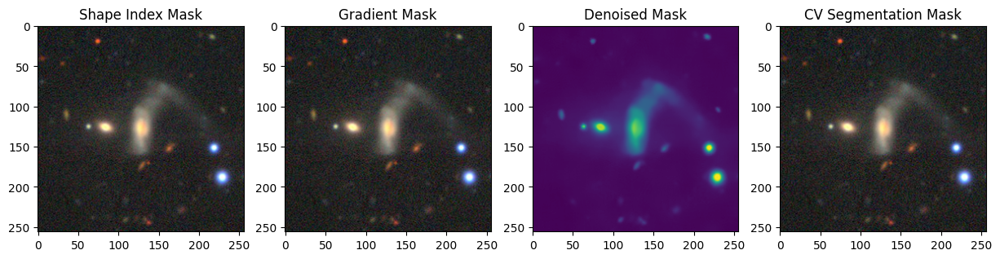

  0%|          | 5/17736 [00:06<6:26:07,  1.31s/it]

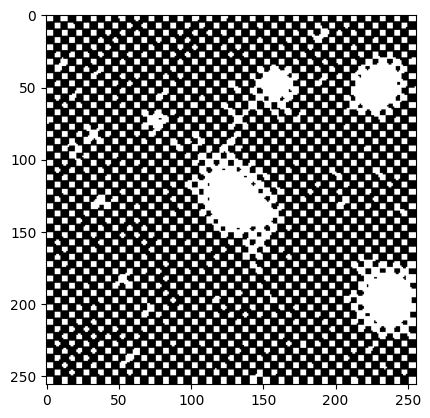

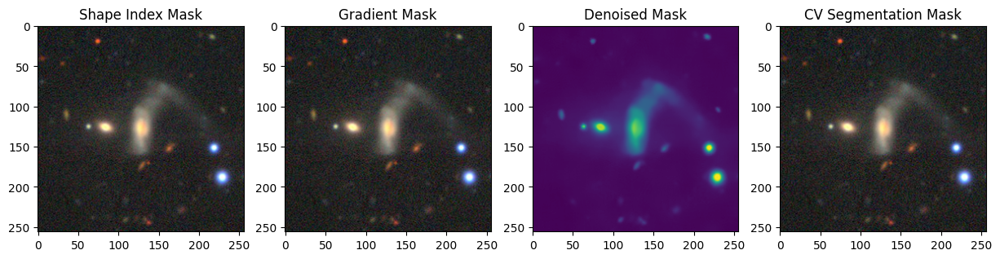

  0%|          | 6/17736 [00:07<6:18:44,  1.28s/it]

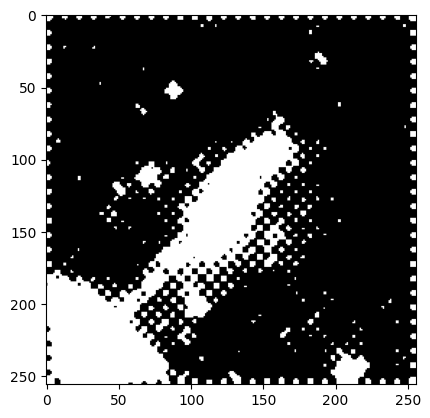

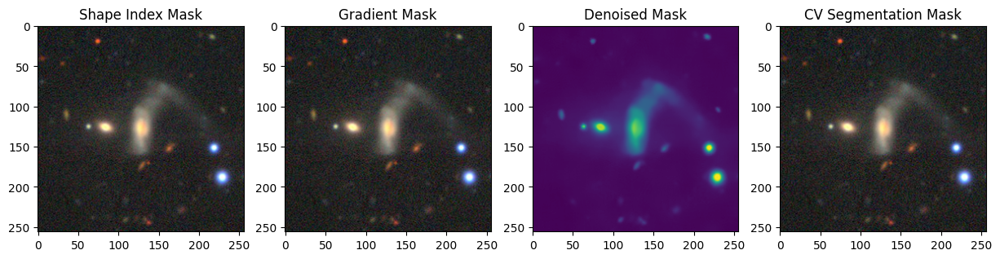

  0%|          | 7/17736 [00:09<6:14:11,  1.27s/it]

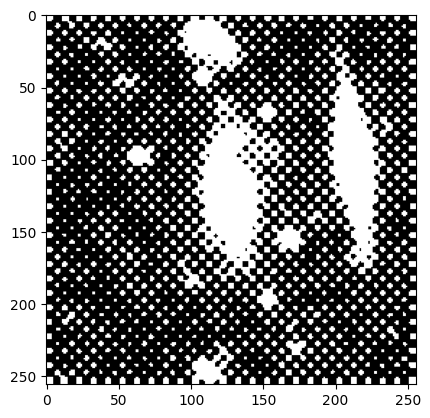

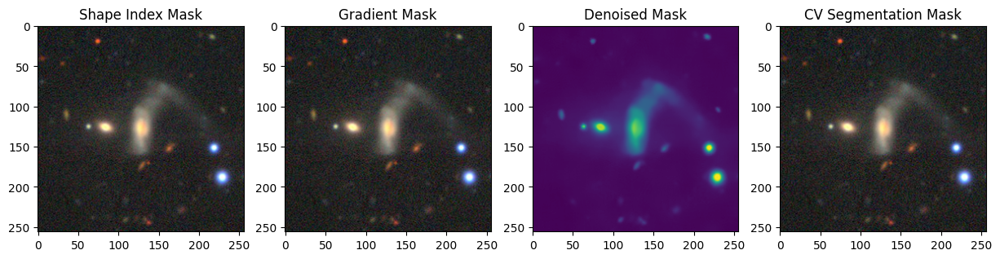

  0%|          | 8/17736 [00:10<6:15:19,  1.27s/it]

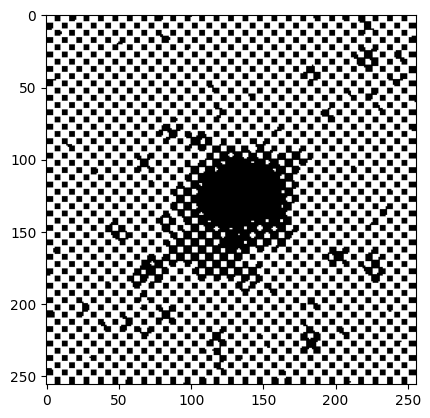

  0%|          | 8/17736 [00:11<7:08:33,  1.45s/it]


KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize an empty list for each mask
blended_images_shape_idx = []
blended_images_gradient = []
denoised_images = []
blended_images_cv_seg = []

for image in tqdm(images):
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3].astype('uint8')
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # For shape index mask
    shape_idx_img = frangi(gray_img)
    cv2.normalize(shape_idx_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    blended_image_shape_idx = cv2.bitwise_or(rgb_image, shape_idx_mask_rgb)
    blended_images_shape_idx.append(blended_image_shape_idx)

    # For gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    cv2.normalize(gradient_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    blended_image_gradient = cv2.bitwise_or(rgb_image, gradient_mask_rgb)
    blended_images_gradient.append(blended_image_gradient)

    # For denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    cv2.normalize(denoised_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    denoised_images.append(denoised_img)

    # For Chan-Vese segmentation mask
    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg = cv_seg.astype(np.uint8)
    cv2.normalize(cv_seg, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg, cv2.COLOR_GRAY2BGR)
    blended_image_cv_seg = cv2.bitwise_or(rgb_image, cv_seg_mask_rgb)
    blended_images_cv_seg.append(blended_image_cv_seg)

    # After the masks have been applied and the images blended
    # ...
    mask_visual = (cv_seg_mask_rgb*255).astype(np.uint8)
    plt.imshow(mask_visual, cmap='gray')
    plt.show()

    # Display the first image from each category
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.imshow(blended_images_shape_idx[0])
    plt.title('Shape Index Mask')

    plt.subplot(1, 4, 2)
    plt.imshow(blended_images_gradient[0])
    plt.title('Gradient Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(denoised_images[0])
    plt.title('Denoised Mask')

    plt.subplot(1, 4, 4)
    plt.imshow(blended_images_cv_seg[0])
    plt.title('CV Segmentation Mask')

    plt.show()
# Convert the lists to Numpy arrays
blended_images_shape_idx = np.array(blended_images_shape_idx)
blended_images_gradient = np.array(blended_images_gradient)
denoised_images = np.array(denoised_images)
blended_images_cv_seg = np.array(blended_images_cv_seg)

print(f'Saved {blended_images_shape_idx.shape[0]} images for shape index mask')
print(f'Saved {blended_images_gradient.shape[0]} images for gradient mask')
print(f'Saved {denoised_images.shape[0]} denoised images')
print(f'Saved {blended_images_cv_seg.shape[0]} images for CV Segmentation mask')

# Save the arrays
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_shape_idx.npy', blended_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_gradient.npy', blended_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/denoised_images.npy', denoised_images)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_cv_seg.npy', blended_images_cv_seg)



  0%|          | 0/17736 [00:00<?, ?it/s]<ipython-input-12-d43d9e63b726>:50: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")


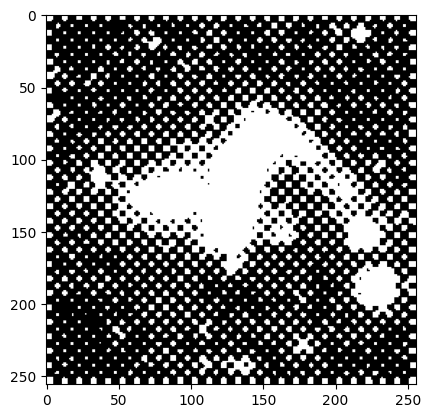

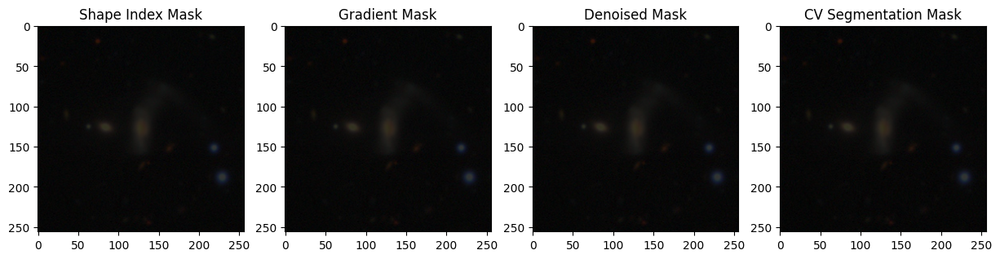

  0%|          | 1/17736 [00:01<6:26:53,  1.31s/it]

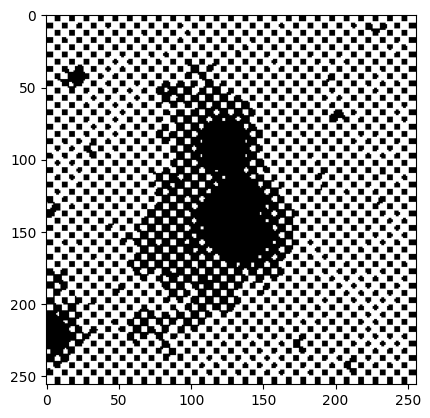

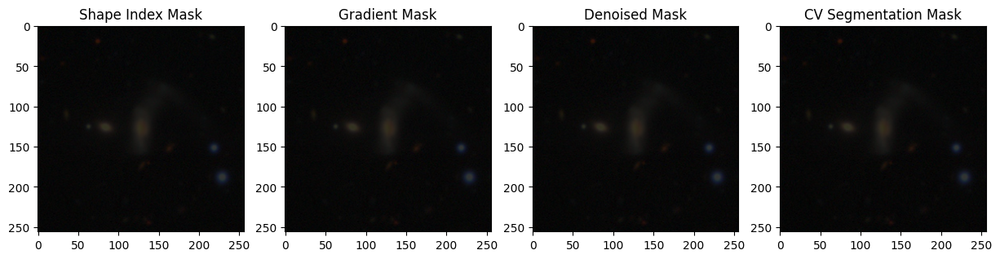

  0%|          | 2/17736 [00:02<6:28:33,  1.31s/it]

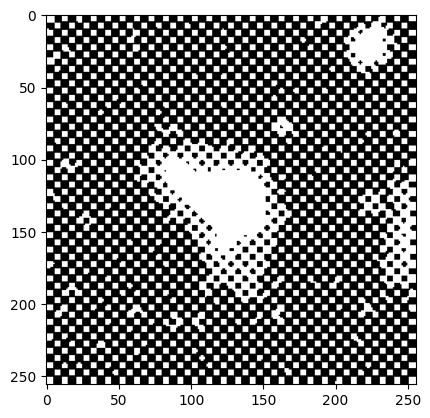

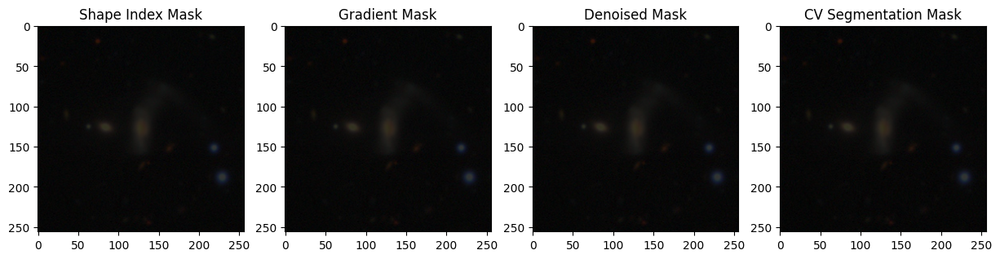

  0%|          | 3/17736 [00:03<6:31:52,  1.33s/it]

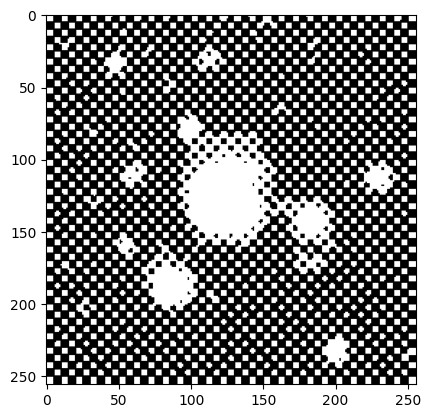

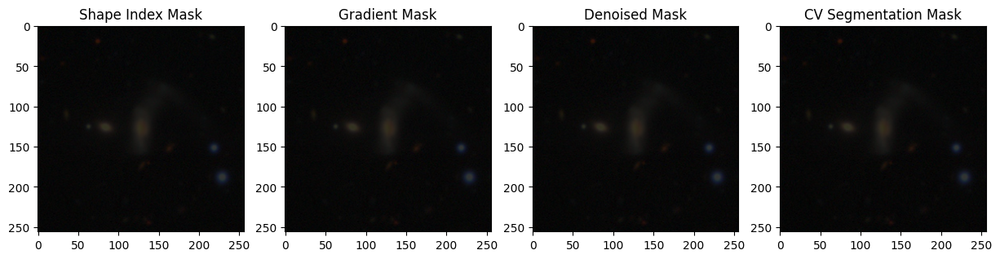

  0%|          | 4/17736 [00:05<6:41:39,  1.36s/it]

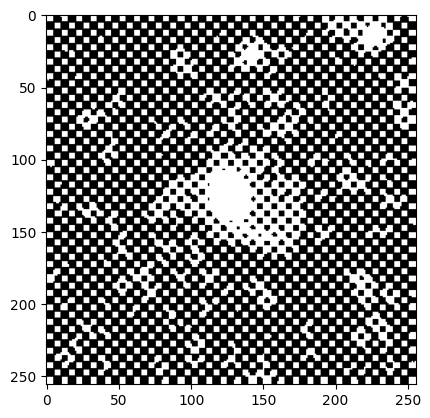

Exception ignored in: <function _xla_gc_callback at 0x7fd9dbd43250>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


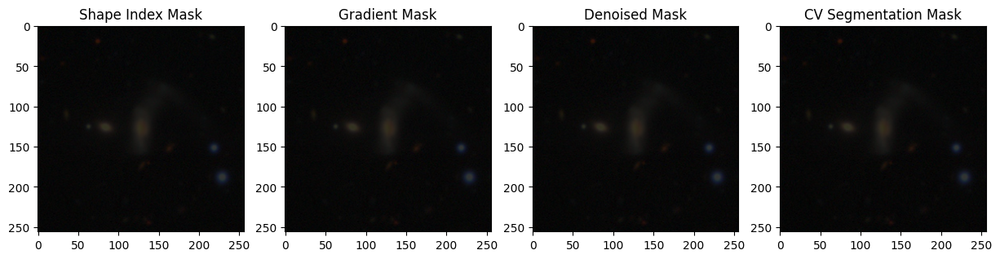

  0%|          | 5/17736 [00:07<7:21:07,  1.49s/it]

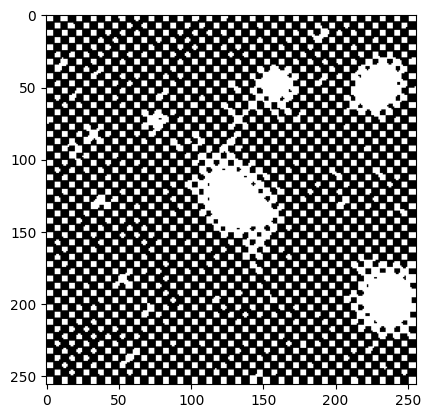

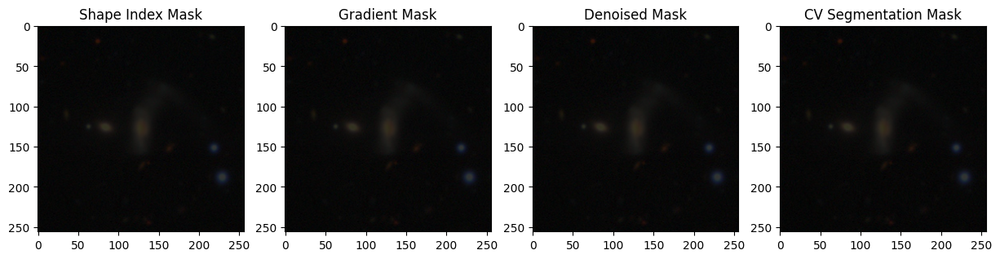

  0%|          | 6/17736 [00:08<7:02:48,  1.43s/it]

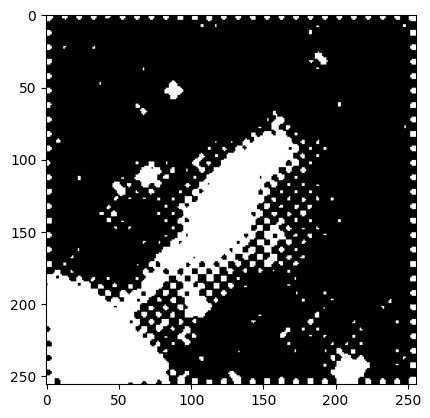

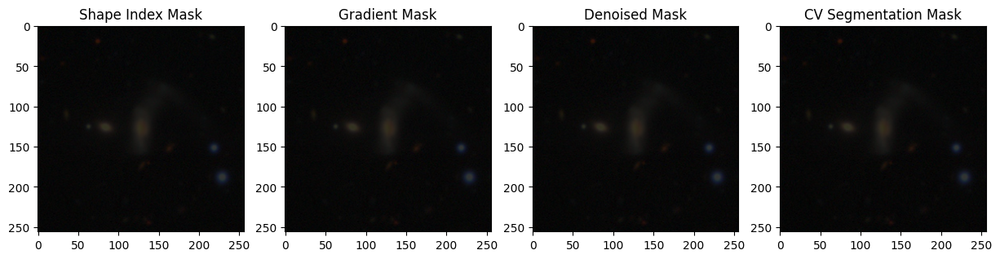

  0%|          | 7/17736 [00:09<6:55:30,  1.41s/it]

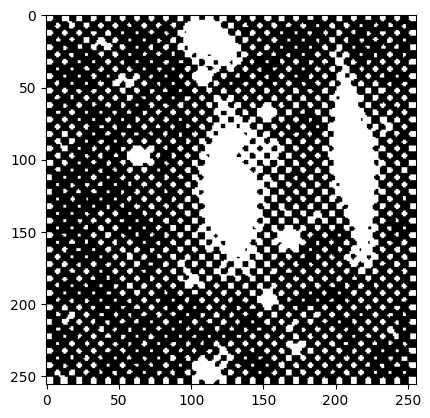

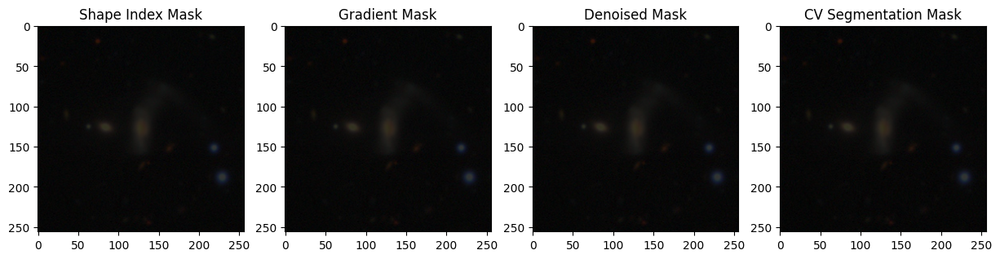

  0%|          | 8/17736 [00:11<6:49:31,  1.39s/it]

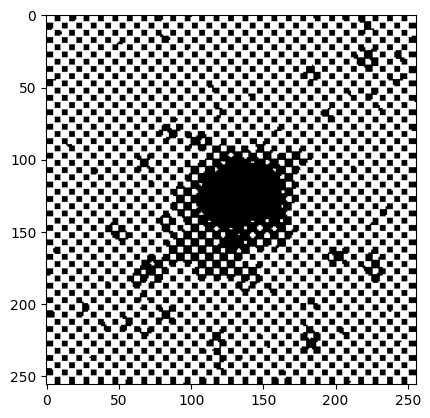

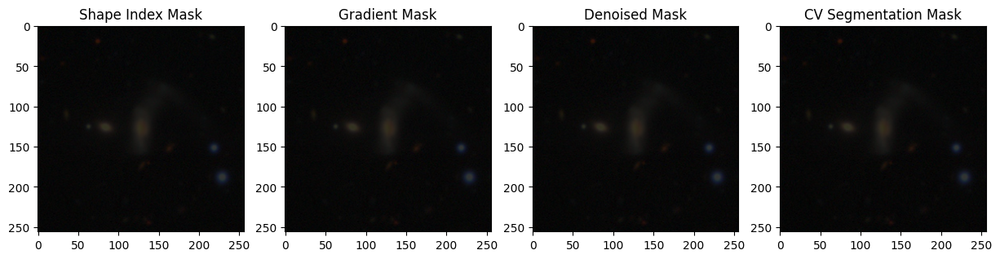

  0%|          | 9/17736 [00:12<6:44:41,  1.37s/it]

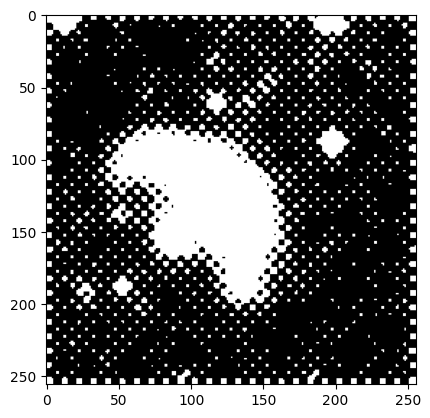

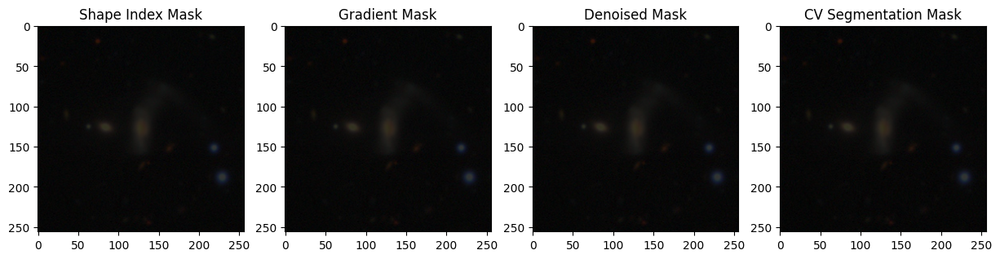

  0%|          | 10/17736 [00:13<6:42:08,  1.36s/it]

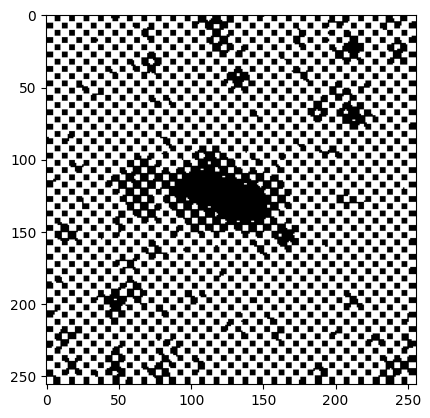

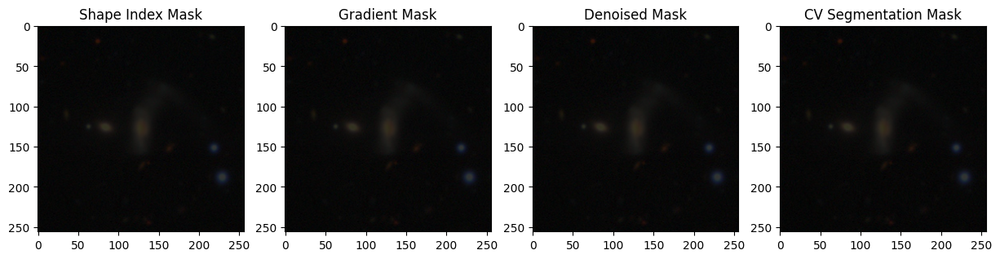

  0%|          | 11/17736 [00:15<6:59:21,  1.42s/it]


KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
from skimage.filters import sobel_h, sobel_v, frangi
from skimage.segmentation import chan_vese
from tqdm import tqdm
import matplotlib.pyplot as plt
# Initialize an empty list for each mask
blended_images_shape_idx = []
blended_images_gradient = []
blended_images_denoised = []
blended_images_cv_seg = []

blend_factor = 0.2  # adjust this according to your requirements

for image in tqdm(images):
    # Assuming the first three channels are r, g, b
    rgb_image = image[..., :3].astype('uint8')
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # For shape index mask
    shape_idx_img = frangi(gray_img)
    cv2.normalize(shape_idx_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    shape_idx_mask = (shape_idx_img > 0).astype('uint8')
    shape_idx_mask_rgb = cv2.cvtColor(shape_idx_mask, cv2.COLOR_GRAY2BGR)
    masked_image_shape_idx = cv2.bitwise_and(rgb_image, shape_idx_mask_rgb)
    blended_image_shape_idx = cv2.addWeighted(rgb_image, blend_factor, masked_image_shape_idx, 1 - blend_factor, 0)
    blended_images_shape_idx.append(blended_image_shape_idx)

    # For gradient mask
    sobel_h_img = sobel_h(gray_img)
    sobel_v_img = sobel_v(gray_img)
    gradient_img = np.sqrt(sobel_h_img ** 2 + sobel_v_img ** 2)
    cv2.normalize(gradient_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    gradient_mask = (gradient_img > 0).astype('uint8')
    gradient_mask_rgb = cv2.cvtColor(gradient_mask, cv2.COLOR_GRAY2BGR)
    masked_image_gradient = cv2.bitwise_and(rgb_image, gradient_mask_rgb)
    blended_image_gradient = cv2.addWeighted(rgb_image, blend_factor, masked_image_gradient, 1 - blend_factor, 0)
    blended_images_gradient.append(blended_image_gradient)

    # For denoised mask
    denoised_img = cv2.fastNlMeansDenoising(gray_img.astype('uint8'), None, 10, 7, 21)
    cv2.normalize(denoised_img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    denoised_mask = (denoised_img > 0).astype('uint8')
    denoised_mask_rgb = cv2.cvtColor(denoised_mask, cv2.COLOR_GRAY2BGR)
    masked_image_denoised = cv2.bitwise_and(rgb_image, denoised_mask_rgb)
    blended_image_denoised = cv2.addWeighted(rgb_image, blend_factor, masked_image_denoised, 1 - blend_factor, 0)
    blended_images_denoised.append(blended_image_denoised)
  # For Chan-Vese segmentation mask

    cv_seg = chan_vese(gray_img, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200, init_level_set="checkerboard")
    cv_seg = cv_seg.astype(np.uint8)
    cv2.normalize(cv_seg, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv_seg_mask = (cv_seg > 0).astype('uint8')
    cv_seg_mask_rgb = cv2.cvtColor(cv_seg_mask, cv2.COLOR_GRAY2BGR)
    masked_image_cv_seg = cv2.bitwise_and(rgb_image, cv_seg_mask_rgb)
    blended_image_cv_seg = cv2.addWeighted(rgb_image, blend_factor, masked_image_cv_seg, 1 - blend_factor, 0)
    blended_images_cv_seg.append(blended_image_cv_seg)


    # After the masks have been applied and the images blended
    # ...
    mask_visual = (cv_seg_mask * 255).astype(np.uint8)
    plt.imshow(mask_visual, cmap='gray')
    plt.show()

    # Display the first image from each category
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 4, 1)
    plt.imshow(blended_images_shape_idx[0])
    plt.title('Shape Index Mask')

    plt.subplot(1, 4, 2)
    plt.imshow(blended_images_gradient[0])
    plt.title('Gradient Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(blended_images_denoised[0])
    plt.title('Denoised Mask')

    plt.subplot(1, 4, 4)
    plt.imshow(blended_images_cv_seg[0])
    plt.title('CV Segmentation Mask')

    plt.show()

# Convert the lists to Numpy arrays
blended_images_shape_idx = np.array(blended_images_shape_idx)
blended_images_gradient = np.array(blended_images_gradient)
blended_images_denoised = np.array(blended_images_denoised)
blended_images_cv_seg = np.array(blended_images_cv_seg)

print(f'Saved {blended_images_shape_idx.shape[0]} images for shape index mask')
print(f'Saved {blended_images_gradient.shape[0]} images for gradient mask')
print(f'Saved {blended_images_denoised.shape[0]} images for denoised mask')
print(f'Saved {blended_images_cv_seg.shape[0]} images for CV Segmentation mask')

# Save the masked_images arrays
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_shape_idx.npy', blended_images_shape_idx)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_gradient.npy', blended_images_gradient)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_denoised.npy', blended_images_denoised)
np.save('/content/drive/MyDrive/galaxy10decals/blended_images_cv_seg.npy', blended_images_cv_seg)
